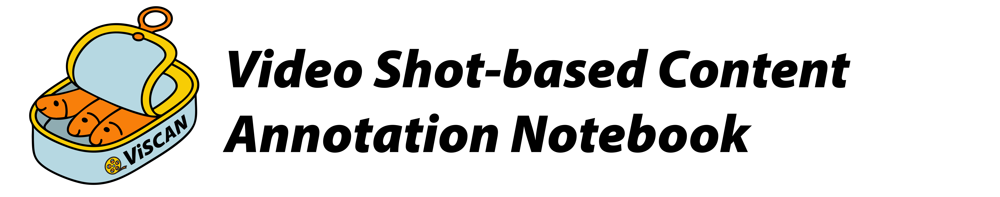

This notebook serves as a proof-of-concept for the methodological approach presented in *"ViSCAT (Video Shot-based Content Annotation Toolkit): Enabling Distant Viewing of short-form videos through shot analysis and timeline visualizations"*. It operationalizes the below analytical workflow and incorporates computational algorithms for processing and annotation. *ViSCAT* is envisioned to enable distant viewing (Arnold and Tilton 2019) of short-form videos for the purposes of style analysis. It is designed to be interoperable with 4CAT (Peeters and Hagen 2022) and intended to be deployed within 4CAT in the future.

This notebook packages the processors as functions for ease of repeated use. It is split into two main parts; first, are the thumbnail annotation processors (TAPs) which analyzes shot thumbnails and adds annotations to the shot dataframe. The second are visualization and data translation processors, which supports exploratory data analysis of the dataset.

---
Prepared by Michael Chow and Shifan Huang


VISCAT_Pipeline.jpg

# 0. Initialize libraries

In [1]:
import os
import re
import ast
import csv
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from datetime import timedelta, datetime

# 1. Load Extracted Data
This notebook is designed to be interoperable with video datasets from 4CAT. It relies on its shot boundary detection processor based on ```PySceneDetect```. The following processors are required to be run:
1. Download videos - Loads videos with links from the dataset
2. Detect scenes in video - Performs shot boundary detection and returns a ```.csv``` containing metadata for each shot
3. Extract first frames in each scene - Downloads the first frame of each scene as a thumbnail

Please download the following files and load them into the notebook by providing their file path:
1. ```video_csv``` - The parent ```.csv``` containing the scraped data for each video
2. ```scene_csv``` - The ```.csv``` containing the metadata for the shot splits in videos
3. thumbnail folder - The parent folder containing the thumbnails for shots in videos

In [2]:
# If running from Google Colab, run this cell
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Load file paths
VIDEO_CSV_PATH = "/content/drive/MyDrive/test/tiktok-dataset-a3749d3a5e530880c6811a4e1b52f380.csv"
SCENE_CSV_PATH = "/content/drive/MyDrive/test/video-scene-detector-e0ea73a338fa85b6b4657ce0fdc14d90.csv"
THUMBNAILS_PATH = "/content/drive/MyDrive/test/video-scene-frames-843359397b51cfa433ba3c47ddcc4aeb"
OUTPUT_DIR = "/content/drive/MyDrive/test/results of OCR" # Output path to write files (?)

In [4]:
# Error checking to ensure the correct CSV files are loaded

# Check video csv
if not VIDEO_CSV_PATH:
    raise ValueError("Please specify the path to the video CSV file.")
else:
    try:
        df_video = pd.read_csv(VIDEO_CSV_PATH)
        required_columns = ["id", # Sample check of required columns to ensure correct csv is loaded
                            "body",
                            "timestamp",
                            "video_url",
                            "tiktok_url",
                            "plays",
                            "hashtags"]
        if not set(required_columns).issubset(set(df_video.columns)):
            raise ValueError("The video .csv file does not appear to be the correct dataset. Please check and load the correct dataset")
        else:
            print("Video CSV file loaded successfully as df_video.")

    except Exception as e:
        print("Error reading video CSV file.")
        print(e)


# Repeat for scene metadata
if not SCENE_CSV_PATH:
    raise ValueError("Please specify the path to the scene CSV file.")
else:
    try:
        df_scene = pd.read_csv(SCENE_CSV_PATH)
        required_columns = ["id", # Sample check of required columns to ensure correct csv is loaded
                            "url",
                            "start_frame",
                            "start_time",
                            "end_frame",
                            "end_time",
                            "scene_num",
                            "total_video_duration"
                            ]
        if not set(required_columns).issubset(set(df_scene.columns)):
            raise ValueError("The scene .csv file does not appear to be the correct dataset. Please check and load the correct dataset")
        else:
            print("Scene CSV file loaded successfully as df_scene.")

    except Exception as e:
        print("Error reading scene CSV file.")
        print(e)

Video CSV file loaded successfully as df_video.
Scene CSV file loaded successfully as df_scene.


In [5]:
# Convert data types and preview df_video
df_video['timestamp'] = pd.to_datetime(df_video['timestamp'])
df_video

,id,thread_id,author,author_full,author_followers,author_likes,author_videos,author_avatar,body,timestamp,...,annotation_number of shots,annotation_Shot Length & Pacing,annotation_video length,annotation_format,annotation_creators,annotation_shot type,annotation_subtitle/caption(overlap text),annotation_topics,annotation_caption type,annotation_background Music
0,7205351622480825643,7205351622480825643,bbnv.anna,Anna,63400,2430,323,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,I changed my shooting location 🖤 what do you t...,2023-02-28 23:24:24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,7444231875545074966,7444231875545074966,learoetger,Lea Marie Rötger,63300,11000,776,https://p16-pu-sign-no.tiktokcdn-eu.com/tos-no...,"If you don't know what to wear in winter, here...",2024-12-03 17:01:43,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7445253171158715654,7445253171158715654,katiaraif,KATIA,21100,2178,80,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,Super cozy winter outfit idea 🧸🤍 #grwm #winter...,2024-12-06 11:04:58,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,7447133242114821381,7447133242114821381,ashevna,Anastasia,302600,17500,689,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,Full outfit info in my ig ashevna 🖤 #ootd #out...,2024-12-11 12:40:32,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7449065823429299487,7449065823429299487,adrisalsi,Adri,29000,12100,320,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,more scarf content bc its almost winter 🙏⛄️ #o...,2024-12-16 17:40:15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316,7448692667283836206,7448692667283836206,demetradias,demetra,4100000,40800,895,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,red nails💋💋feeling very matchy matchy #wintero...,2024-12-15 17:31:53,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
317,7324407518006873387,7324407518006873387,thatgemruby,Ruby🩰🦢🎀,183600,12700,1370,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,Pls the red chanel from @Rebag makes this whol...,2024-01-15 19:22:16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
318,7440486284239326497,7440486284239326497,chiprooma,Chips,254100,32800,231,https://p16-sign-useast2a.tiktokcdn.com/tos-us...,How to not freeze this winter… #fyp #streetwea...,2024-11-23 14:47:06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
319,7287312322584988934,7287312322584988934,user1866163826113,khamguy,382,341,4,https://p16-sign-va.tiktokcdn.com/tos-maliva-a...,ไอเดียการแต่งตัวหน้าหนาว#เสื้อกันหนาว #เสื้อไห...,2023-10-07 20:13:42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df_video.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 321 entries, 0 to 320
Data columns (total 46 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   id                                         321 non-null    int64         
 1   thread_id                                  321 non-null    int64         
 2   author                                     321 non-null    object        
 3   author_full                                321 non-null    object        
 4   author_followers                           321 non-null    int64         
 5   author_likes                               321 non-null    int64         
 6   author_videos                              321 non-null    int64         
 7   author_avatar                              321 non-null    object        
 8   body                                       321 non-null    object        
 9   timestamp            

In [5]:
# Convert data types and preview df_scene
df_scene['start_time'] = pd.to_timedelta(df_scene['start_time'])
df_scene['end_time'] = pd.to_timedelta(df_scene['end_time'])
df_scene['total_video_duration'] = pd.to_timedelta(df_scene['total_video_duration'])
df_scene

,id,url,from_dataset,start_frame,start_time,start_fps,end_frame,end_time,end_fps,scene_num,num_scenes_detected,total_video_frames,total_video_duration,post_ids
0,7447133242114821381.mp4_scene_1,7447133242114821381,a3749d3a5e530880c6811a4e1b52f380,0,0 days 00:00:00,30.0,18,0 days 00:00:00.600000,30.0,1,14,399,0 days 00:00:13.300000,"7,4,4,7,1,3,3,2,4,2,1,1,4,8,2,1,3,8,1"
1,7447133242114821381.mp4_scene_2,7447133242114821381,a3749d3a5e530880c6811a4e1b52f380,18,0 days 00:00:00.600000,30.0,46,0 days 00:00:01.533000,30.0,2,14,399,0 days 00:00:13.300000,"7,4,4,7,1,3,3,2,4,2,1,1,4,8,2,1,3,8,1"
2,7447133242114821381.mp4_scene_3,7447133242114821381,a3749d3a5e530880c6811a4e1b52f380,46,0 days 00:00:01.533000,30.0,77,0 days 00:00:02.567000,30.0,3,14,399,0 days 00:00:13.300000,"7,4,4,7,1,3,3,2,4,2,1,1,4,8,2,1,3,8,1"
3,7447133242114821381.mp4_scene_4,7447133242114821381,a3749d3a5e530880c6811a4e1b52f380,77,0 days 00:00:02.567000,30.0,98,0 days 00:00:03.267000,30.0,4,14,399,0 days 00:00:13.300000,"7,4,4,7,1,3,3,2,4,2,1,1,4,8,2,1,3,8,1"
4,7447133242114821381.mp4_scene_5,7447133242114821381,a3749d3a5e530880c6811a4e1b52f380,98,0 days 00:00:03.267000,30.0,117,0 days 00:00:03.900000,30.0,5,14,399,0 days 00:00:13.300000,"7,4,4,7,1,3,3,2,4,2,1,1,4,8,2,1,3,8,1"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
953,7459210611264703752.mp4_scene_3,7459210611264703752,a3749d3a5e530880c6811a4e1b52f380,51,0 days 00:00:01.700000,30.0,79,0 days 00:00:02.633000,30.0,3,7,217,0 days 00:00:07.233000,"7,4,5,9,2,1,0,6,1,1,2,6,4,7,0,3,7,5,2"
954,7459210611264703752.mp4_scene_4,7459210611264703752,a3749d3a5e530880c6811a4e1b52f380,79,0 days 00:00:02.633000,30.0,117,0 days 00:00:03.900000,30.0,4,7,217,0 days 00:00:07.233000,"7,4,5,9,2,1,0,6,1,1,2,6,4,7,0,3,7,5,2"
955,7459210611264703752.mp4_scene_5,7459210611264703752,a3749d3a5e530880c6811a4e1b52f380,117,0 days 00:00:03.900000,30.0,153,0 days 00:00:05.100000,30.0,5,7,217,0 days 00:00:07.233000,"7,4,5,9,2,1,0,6,1,1,2,6,4,7,0,3,7,5,2"
956,7459210611264703752.mp4_scene_6,7459210611264703752,a3749d3a5e530880c6811a4e1b52f380,153,0 days 00:00:05.100000,30.0,184,0 days 00:00:06.133000,30.0,6,7,217,0 days 00:00:07.233000,"7,4,5,9,2,1,0,6,1,1,2,6,4,7,0,3,7,5,2"


# 2. Thumbnail Annotator Processors
Lorem Ipsum

## Shot Scale

## Initialize Libraries

In [6]:
!pip install opencv-python matplotlib mediapipe numpy
!pip install --upgrade numpy
!pip install --upgrade --force-reinstall mediapipe scipy

import os
import cv2
import csv
import re
import json
import pandas as pd
import numpy as np
import mediapipe as mp
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import Counter
import pandas as pd
from PIL import Image

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 86.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 22.2 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.4
    Uninstalling protobuf-5.29.4:
      Successfully uninstalled protobuf-5.29.4
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydf 0.11.0 requires protobuf<6.0.0,>=5.29.1, but you have protobuf 4.25.6 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
grpcio-

/usr/local/lib/python3.11/dist-packages/jaxlib/plugin_support.py:71: RuntimeWarning: JAX plugin jax_cuda12_plugin version 0.5.1 is installed, but it is not compatible with the installed jaxlib version 0.6.0, so it will not be used.
  warnings.warn(


## Shot Scale Analysis

### Shot scale classification & Annotator




In [7]:
# Initialize MediaPipe
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

# Extract keypoints
def get_keypoints(frame):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    results = pose.process(frame_rgb)
    keypoints = [None] * 33
    if results.pose_landmarks:
        for idx, lm in enumerate(results.pose_landmarks.landmark):
            keypoints[idx] = (int(lm.x * frame.shape[1]), int(lm.y * frame.shape[0]))
    return keypoints

# shot scale classification
def classify_shot_scale(keypoints, frame_height):
    if not keypoints or keypoints[0] is None:
        return "Empty Shot"

    point_names = {
        0: 'Nose', 1: 'LEye', 2: 'REye', 3: 'LEar', 4: 'REar',
        11: 'LShoulder', 12: 'RShoulder', 23: 'LHip', 24: 'RHip',
        25: 'LKnee', 26: 'RKnee', 27: 'LAnkle', 28: 'RAnkle'
    }

    key_parts = []
    y_values = []

    for idx, pt in enumerate(keypoints):
        if pt is not None and idx in point_names:
            key_parts.append(point_names[idx])
            y_values.append(pt[1])

    if not y_values:
        return "Empty Shot"

    min_y, max_y = min(y_values), max(y_values)

    body_parts = set(key_parts)
    head_parts = {'Nose', 'REye', 'LEye', 'REar', 'LEar'}
    chest_below_parts = {'MidHip', 'RHip', 'LHip', 'RKnee', 'LKnee'}
    feet_parts = {'RAnkle', 'LAnkle'}

    if body_parts.intersection(head_parts) and body_parts.intersection(feet_parts):
        if (max_y - min_y) <= frame_height / 2:
            return "Long Shot"
        else:
            return "Full Shot"
    elif body_parts.intersection(head_parts) and not body_parts.intersection(feet_parts) and body_parts.intersection(chest_below_parts):
        return "Medium Shot"
    elif body_parts.intersection(head_parts) and not body_parts.intersection(chest_below_parts) and 'Neck' in body_parts:
        return "Medium Close-Up"
    elif body_parts.intersection(head_parts) and 'Neck' not in body_parts:
        return "Close-Up"
    else:
        return "Close-Up"

# Extract scene number from filename
def extract_scene_num(filename):
    match = re.search(r'scene[_\-]?(\d+)', filename, re.IGNORECASE)
    return int(match.group(1)) if match else None

# Main function: annotate shot scales and save back to CSV
def generate_scene_with_shotscale(image_root_dir, scene_csv_path):
    df_scene = pd.read_csv(scene_csv_path)
    df_scene["shot_scales"] = [[] for _ in range(len(df_scene))]

    # Build a mapping (scene_num, url) → DataFrame index
    scene_index_map = {
        (str(row["scene_num"]), str(row["url"]).strip()): idx
        for idx, row in df_scene.iterrows()
    }

    # Loop over all video folders
    subfolders = [d for d in os.listdir(image_root_dir) if os.path.isdir(os.path.join(image_root_dir, d))]
    for folder in subfolders:
        folder_path = os.path.join(image_root_dir, folder)
        images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        for img_name in sorted(images):
            img_path = os.path.join(folder_path, img_name)
            frame = cv2.imread(img_path)
            if frame is None:
                continue
            keypoints = get_keypoints(frame)
            shot_scale = classify_shot_scale(keypoints, frame.shape[0])
            scene_num = extract_scene_num(img_name)
            key = (str(scene_num), folder.strip())
            if key in scene_index_map:
                idx = scene_index_map[key]
                df_scene.at[idx, "shot_scales"].append(shot_scale)

    # Convert list to JSON string for CSV storage
    df_scene["shot_scales"] = df_scene["shot_scales"].apply(json.dumps)

    # Overwrite the original CSV with added annotations
    df_scene.to_csv(scene_csv_path, index=False)

    # Show preview
    print(f"✅ Shot scale annotations written to: {scene_csv_path}")
    print("\n🎯 Preview of updated DataFrame:")
    print(df_scene[["scene_num", "url", "shot_scales"]].head())

    return df_scene

In [8]:
#Get the results
if __name__ == "__main__":
    generate_scene_with_shotscale(
        image_root_dir=THUMBNAILS_PATH,
        scene_csv_path=SCENE_CSV_PATH
    )

✅ Shot scale annotations written to: /content/drive/MyDrive/test/video-scene-detector-e0ea73a338fa85b6b4657ce0fdc14d90.csv

🎯 Preview of updated DataFrame:
   scene_num                  url    shot_scales
0          1  7447133242114821381  ["Long Shot"]
1          2  7447133242114821381  ["Full Shot"]
2          3  7447133242114821381  ["Full Shot"]
3          4  7447133242114821381  ["Full Shot"]
4          5  7447133242114821381  ["Full Shot"]


### Shot scale classification & Visualization (normalized time)

#### Visualization of Shot Scales for all videos

In [9]:
# Color Scheme
SHOT_SCALE_COLORS = {
    'Close-Up': '#ff4500',
    'Medium Close-Up': '#ffa500',
    'Medium Shot': '#f0e68c',
    'Full Shot': '#4682b4',
    'Long Shot': '#4169e1',
    'Empty Shot': '#d3d3d3'
}

#Visualization function
def generate_all_videos_normalized_timeline():
    df_scene = pd.read_csv(SCENE_CSV_PATH)

    # Reconvert time columns to timedelta
    df_scene['start_time'] = pd.to_timedelta(df_scene['start_time'])
    df_scene['end_time'] = pd.to_timedelta(df_scene['end_time'])
    df_scene['total_video_duration'] = pd.to_timedelta(df_scene['total_video_duration'])

    # Load shot_scales as list
    df_scene = df_scene.dropna(subset=["shot_scales", "total_video_duration"])
    df_scene["shot_scales"] = df_scene["shot_scales"].apply(json.loads)

    all_shots = []
    grouped = df_scene.groupby("url")

    for video_id, group in grouped:
        max_time = group["total_video_duration"].max().total_seconds()
        if pd.isna(max_time) or max_time == 0:
            continue

        for _, row in group.iterrows():
            start = row["start_time"].total_seconds() / max_time
            end = row["end_time"].total_seconds() / max_time
            duration = end - start
            scales = row["shot_scales"]
            if not scales:
                continue
            step = duration / len(scales)
            for i, scale in enumerate(scales):
                shot_start = start + i * step
                shot_end = shot_start + step
                all_shots.append((video_id, scale, shot_start, shot_end))

    if not all_shots:
        print("⚠️ No valid shot scale data to visualize.")
        return

    # Plot
    video_ids = sorted(set(x[0] for x in all_shots))
    video_to_y = {vid: idx for idx, vid in enumerate(video_ids)}

    fig, ax = plt.subplots(figsize=(12, len(video_ids) * 0.6))
    for vid, scale, start, end in all_shots:
        y = video_to_y[vid]
        color = SHOT_SCALE_COLORS.get(scale, "#999999")
        rect = patches.Rectangle((start, y), end - start, 0.8, linewidth=0.3,
                                 edgecolor='black', facecolor=color)
        ax.add_patch(rect)

    ax.set_xlim(0, 1)
    ax.set_ylim(-0.5, len(video_ids) - 0.5)
    ax.set_yticks(range(len(video_ids)))
    ax.set_yticklabels(video_ids)
    ax.set_xlabel("Normalized Time")
    ax.set_title("All Videos - Shot Scale Timeline")
    ax.legend(handles=[
        patches.Patch(color=color, label=scale)
        for scale, color in SHOT_SCALE_COLORS.items()
    ], bbox_to_anchor=(1.01, 1), loc='upper left', title="Shot Scale", fontsize=8)

    plt.tight_layout()
    output_path = os.path.join(OUTPUT_DIR, "all_videos_normalized_timeline.png")
    plt.savefig(output_path)
    plt.close()
    print(f"✅ Timeline visualization saved: {output_path}")

# Run it
if __name__ == "__main__":
    generate_all_videos_normalized_timeline()

✅ Timeline visualization saved: /content/drive/MyDrive/test/results of OCR/all_videos_normalized_timeline.png


#### Visualization of Shot Scales for all videos (stripe_style)

In [10]:
# Color mapping
SHOT_SCALE_COLORS = {
    'Close-Up': '#ff4500',
    'Medium Close-Up': '#ffa500',
    'Medium Shot': '#f0e68c',
    'Full Shot': '#4682b4',
    'Long Shot': '#4169e1',
    'Empty Shot': '#d3d3d3'
}

#Visualization function
def generate_stripe_style_normalized_timeline():
    # Create output directory if it doesn't exist
    os.makedirs(OUTPUT_DIR, exist_ok=True)

    df = pd.read_csv(SCENE_CSV_PATH)
    df['start_time'] = pd.to_timedelta(df['start_time'])
    df['end_time'] = pd.to_timedelta(df['end_time'])
    df['total_video_duration'] = pd.to_timedelta(df['total_video_duration'])
    df['shot_scales'] = df['shot_scales'].apply(json.loads)

    shots = []
    for vid, group in df.groupby("url"):
        max_time = group["total_video_duration"].max().total_seconds()
        if not max_time or max_time == 0:
            continue
        for _, row in group.iterrows():
            start = row['start_time'].total_seconds() / max_time
            end = row['end_time'].total_seconds() / max_time
            scales = row['shot_scales']
            if not scales or end <= start:
                continue
            step = (end - start) / len(scales)
            for i, scale in enumerate(scales):
                s = start + i * step
                e = s + step
                shots.append((vid, scale, s, e))

    stripe_height = 0.02
    videos = sorted(set(v for v, _, _, _ in shots))
    vid_y = {v: i for i, v in enumerate(videos)}

    fig_height = len(videos) * stripe_height
    fig, ax = plt.subplots(figsize=(12, fig_height))
    for v, scale, s, e in shots:
        y = vid_y[v] * stripe_height
        rect = patches.Rectangle((s, y), e - s, stripe_height, linewidth=0,
                                 facecolor=SHOT_SCALE_COLORS.get(scale, '#999999'))
        ax.add_patch(rect)

#Plot
    ax.set_xlim(0, 1)
    ax.set_ylim(0, len(videos) * stripe_height)
    ax.axis("off")
    plt.tight_layout()

    output_path = os.path.join(OUTPUT_DIR,  "stripe_style_normalized_timeline.png")
    plt.savefig(output_path, dpi=300)
    plt.close()
    print(f"✅ Stripe-style normalized timeline saved: {output_path}")

# Run it
if __name__ == "__main__":
    generate_stripe_style_normalized_timeline()

✅ Stripe-style normalized timeline saved: /content/drive/MyDrive/test/results of OCR/stripe_style_normalized_timeline.png


### Shot scale classification & Visualization (absolute time)

#### Visualization of Shot Scales for all videos

In [11]:
# Color Scheme
SHOT_SCALE_COLORS = {
    'Close-Up': '#ff4500',
    'Medium Close-Up': '#ffa500',
    'Medium Shot': '#f0e68c',
    'Full Shot': '#4682b4',
    'Long Shot': '#4169e1',
    'Empty Shot': '#d3d3d3'
}

#Visualization function
def generate_all_videos_absolute_timeline():
    df_scene = pd.read_csv(SCENE_CSV_PATH)

    # Reconvert time columns to timedelta
    df_scene['start_time'] = pd.to_timedelta(df_scene['start_time'])
    df_scene['end_time'] = pd.to_timedelta(df_scene['end_time'])
    df_scene['total_video_duration'] = pd.to_timedelta(df_scene['total_video_duration'])

    # Load shot_scales as list
    df_scene = df_scene.dropna(subset=["shot_scales", "total_video_duration"])
    df_scene["shot_scales"] = df_scene["shot_scales"].apply(json.loads)

    all_shots = []
    grouped = df_scene.groupby("url")

    for video_id, group in grouped:
        max_time = group["total_video_duration"].max().total_seconds()
        if pd.isna(max_time) or max_time == 0:
            continue

        for _, row in group.iterrows():
            start = row["start_time"].total_seconds()
            end = row["end_time"].total_seconds()
            duration = end - start
            scales = row["shot_scales"]
            if not scales:
                continue
            step = duration / len(scales)
            for i, scale in enumerate(scales):
                shot_start = start + i * step
                shot_end = shot_start + step
                all_shots.append((video_id, scale, shot_start, shot_end))

    if not all_shots:
        print("⚠️ No valid shot scale data to visualize.")
        return

    # Plot
    video_ids = sorted(set(x[0] for x in all_shots))
    video_to_y = {vid: idx for idx, vid in enumerate(video_ids)}

    fig, ax = plt.subplots(figsize=(12, len(video_ids) * 0.6))
    for vid, scale, start, end in all_shots:
        y = video_to_y[vid]
        color = SHOT_SCALE_COLORS.get(scale, "#999999")
        rect = patches.Rectangle((start, y), end - start, 0.8, linewidth=0.3,
                                 edgecolor='black', facecolor=color)
        ax.add_patch(rect)

    ax.set_xlim(0, max_time)
    ax.set_ylim(-0.5, len(video_ids) - 0.5)
    ax.set_yticks(range(len(video_ids)))
    ax.set_yticklabels(video_ids)
    ax.set_xlabel("Absolute Time")
    ax.set_title("All Videos - Shot Scale Timeline")
    ax.legend(handles=[
        patches.Patch(color=color, label=scale)
        for scale, color in SHOT_SCALE_COLORS.items()
    ], bbox_to_anchor=(1.01, 1), loc='upper left', title="Shot Scale", fontsize=8)

    plt.tight_layout()
    output_path = os.path.join(OUTPUT_DIR, "all_videos_absolute_timeline.png")
    plt.savefig(output_path)
    plt.close()
    print(f"✅ Timeline visualization saved: {output_path}")

# Run it
if __name__ == "__main__":
    generate_all_videos_absolute_timeline()


✅ Timeline visualization saved: /content/drive/MyDrive/test/results of OCR/all_videos_absolute_timeline.png


#### Visualization of Shot Scales for all videos (stripe_style)

In [12]:
# Color mapping
SHOT_SCALE_COLORS = {
    'Close-Up': '#ff4500',
    'Medium Close-Up': '#ffa500',
    'Medium Shot': '#f0e68c',
    'Full Shot': '#4682b4',
    'Long Shot': '#4169e1',
    'Empty Shot': '#d3d3d3'
}

#Visualization function
def generate_stripe_style_absolute_timeline():
    df = pd.read_csv(SCENE_CSV_PATH)
    df['start_time'] = pd.to_timedelta(df['start_time'])
    df['end_time'] = pd.to_timedelta(df['end_time'])
    df['total_video_duration'] = pd.to_timedelta(df['total_video_duration'])
    df['shot_scales'] = df['shot_scales'].apply(json.loads)

    shots = []
    for vid, group in df.groupby("url"):
        for _, row in group.iterrows():
            start = row['start_time'].total_seconds()
            end = row['end_time'].total_seconds()
            scales = row['shot_scales']
            if not scales or end <= start:
                continue
            step = (end - start) / len(scales)
            for i, scale in enumerate(scales):
                s = start + i * step
                e = s + step
                shots.append((vid, scale, s, e))

    stripe_height = 0.02
    videos = sorted(set(v for v, _, _, _ in shots))
    vid_y = {v: i for i, v in enumerate(videos)}

    fig_height = len(videos) * stripe_height
    fig, ax = plt.subplots(figsize=(12, fig_height))
    for v, scale, s, e in shots:
        y = vid_y[v] * stripe_height
        rect = patches.Rectangle((s, y), e - s, stripe_height, linewidth=0,
                                 facecolor=SHOT_SCALE_COLORS.get(scale, '#999999'))
        ax.add_patch(rect)

#plot
    ax.set_xlim(0, max(e for _, _, _, e in shots))
    ax.set_ylim(0, len(videos) * stripe_height)
    ax.axis("off")
    plt.tight_layout()

    #output
    output_path = os.path.join(OUTPUT_DIR, "stripe_style_absolute_timeline.png")
    plt.savefig(output_path, dpi=300)
    plt.close()
    print(f"✅ Stripe-style absolute timeline saved: {output_path}")

# Run it
if __name__ == "__main__":
    generate_stripe_style_absolute_timeline()

✅ Stripe-style absolute timeline saved: /content/drive/MyDrive/test/results of OCR/stripe_style_absolute_timeline.png


## 2b. Face Detection and Recognition

This processor uses ```face_recognition``` (__) to detect and match faces in video thumbnails.
Please run the initialisation block, followed by the function ```annotate_face_recognition(df_scene, frames_folder, reference_faces)``` as listed below.

### Initialize functions for face recognition

In [ ]:
!pip install face_recognition
import face_recognition

In [ ]:
# Base function to detect faces
def get_faces(image_path):
    # https://github.com/ageitgey/face_recognition/blob/master/examples/identify_and_draw_boxes_on_faces.py
    image = face_recognition.load_image_file(image_path)
    face_locations_list = face_recognition.face_locations(image)  # Do not assume there's only one person in the image
    face_encodings_list = face_recognition.face_encodings(image, face_locations_list)
    return face_locations_list, face_encodings_list

# Loops through a scene dataset and locates faces
def get_faces_batch(scene_data, frames_folder):

    '''
    :param scene_data: dataframe containing scene data
    :param frames_folder: file path str; Target folder path where the scene thumbnails are stored
    :return: scene_data: Updated dataframe with face_locations_list and face_encodings_list
    '''


    # Initialize empty columns
    scene_data['face_locations_list'] = None
    scene_data['face_encodings_list'] = None
    scene_data['face_count'] = None

    # Loop through all shots
    for i, shot in scene_data.iterrows():
        video_id = shot['url']
        scene_id = shot['id']
        # scene_id example '7295526580741229825.mp4_scene_1'
        cleaned_id = re.sub(r'\.mp4', '', scene_id)
        # cleaned_id example '7295526580741229825_scene_1'
        # create thumbnail path based on video_id
        thumbnail_path = os.path.join(frames_folder, str(video_id), f'{cleaned_id}.jpeg')

        try:
            # Attempt to load the image
            image = face_recognition.load_image_file(thumbnail_path)

            # Process the image to get face locations and encodings
            print(f'Processing {cleaned_id}.jpeg...')
            face_locations_list, face_encodings_list = get_faces(thumbnail_path)

            # Update the DataFrame directly in the respective columns
            scene_data.at[i, 'face_locations_list'] = face_locations_list
            scene_data.at[i, 'face_encodings_list'] = face_encodings_list
            scene_data.at[i, 'face_count'] = len(face_encodings_list)

        except FileNotFoundError:
            print(f"Error: File not found at {thumbnail_path}")

        except Exception as e:
            print(f"Error: Could not process {thumbnail_path} due to {str(e)}")

        # Data now contains information of people detected in the video (with their location and encoding)
    return scene_data

# Function to validate user input
def get_valid_input(prompt):
    while True:
        user_input = input(prompt).strip().lower()  # Strips spaces and converts input to lowercase
        if user_input in ['y', 'n']:
            return user_input
        print("Invalid input. Please enter 'y' or 'n'.")

# Function to process user reference faces
def process_user_faces(reference_faces):
    # Processes user input of list of reference face dictionaries

    faces_data = [] # Initialise list of dictionaries containing faces data

    for face in reference_faces:
        print()
        file_path = face["face_path"]
        # Check if the file exists
        if not os.path.exists(file_path):
            print(f"Error: {file_path} does not exist. Continuing to next reference shot.")
            continue

        # Load the image using OpenCV
        reference_image = cv2.imread(file_path)

        if reference_image is None:
            print(f"Error: Unable to load the {file_path}. Please check the file format or compatibility.")
            return None

        print(f"Reference image {os.path.basename(file_path)} uploaded successfully!")
        print("Locating face in the reference image...")

        face_encoding_list = face_recognition.face_encodings(reference_image)
        if len(face_encoding_list) == 0:
            print(f"Error: No faces found in the reference image. {file_path}")
            return None
        elif len(face_encoding_list) > 1:
            print(f"Warning: Multiple faces found in the reference image {file_path}. Only the first face will be used.")
            face_encoding = face_encoding_list[0]
        elif len(face_encoding_list) == 1:
            face_encoding = face_encoding_list[0]

        face_label = face["face_label"]

        if face_encoding is not None:
                faces_data.append({'face_label': face_label,
                                   'face_encoding': face_encoding,
                                   'matched_shots': [],
                                   'count': 0})

    return faces_data

# Match similar faces together
def match_faces_in_videos(scene_data, reference_faces):
    '''
    :param scene_data: list of dictionaries containing the scene data
    :return: df_scene_data, df_faces:
    '''
    # Check for valid dataframe; DataFrame needs to have 'face_locations_list' and 'face_encodings_list' as columns

    if reference_faces:
        faces_data = process_user_faces(reference_faces)
    else:
        faces_data = []

    scene_data['face_list'] = None


    # Ask for tolerance input
    while True:
        try:
            # Ask the user for input with default information
            user_input = input("Enter a tolerance value (must be a float between 0 and 1, default is 0.5): ")

            # If the user presses Enter without input, use the default value
            if user_input.strip() == "":
                tolerance = 0.5
                print(f"No input provided. Using default tolerance value: {tolerance}.")
                break

            # Convert the input to float and validate
            tolerance = float(user_input)
            if 0 <= tolerance <= 1:
                print(f"Valid input! Tolerance set to {tolerance}.")
                break
            else:
                print("Error: The value must be between 0 and 1. Please try again.")
        except ValueError:
            print("Error: Please enter a valid float number. Try again.")


    # Loop through scenes
    for i, shot in scene_data.iterrows(): # shot is a dictionary

        # Retrieve face encodings
        face_encodings_list = shot['face_encodings_list']

        # Initialize face_matches for shot; Contains list of face_label (s)
        # Purpose is to track the faces found in a shot
        face_list = []

        for face_encoding in face_encodings_list: # Loop through each face_encoding in list

            match = False # Initialize match

            # Loop through existing matches
            for face in faces_data:  # Dictionary containing existing face information
                result = face_recognition.compare_faces([face['face_encoding']], # Singular face
                                                        face_encoding, # Current face we are checking
                                                        tolerance = tolerance # Adjust tolerance as needed
                                                        # Lower is stricter
                                                        )

                if result[0]: # For True; Since we are only comparing one face at a time, there will only be one result
                    print(f'{shot["id"]} matches existing face ({face["face_label"]}).')
                    face['matched_shots'].append(shot['id'])
                    face['count'] += 1
                    face_list.append(face['face_label']) # Update list of face_labels
                    match = True
                    break

            if not match: # If there is no existing match
                print(f'New face detected in {shot["id"]}')
                # Add new face into face_list
                face_label = f'face_{len(faces_data)}'
                faces_data.append({'face_label': face_label,
                                           'face_encoding': face_encoding,
                                           'matched_shots': [shot['id']],
                                           'count': 1
                                                      })
                # Add to rolling list of face_labels for the current shot
                face_list.append(face_label)

        # Add face_list to scene_data
        scene_data.at[i, 'face_list'] = face_list
    faces_data = pd.DataFrame(faces_data) # Convert to DataFrame
    return scene_data, faces_data

In [ ]:
# Main function
def annotate_face_recognition(df_scene=df_scene, frames_folder=THUMBNAILS_PATH, reference_faces=[]):
    '''

    :param df_scene: target scene dataframe
    :param frames_folder: folder directory of scene thumbnails
    :param reference_faces: list of dictionaries with keys of 'face_path' and 'face_label' containing reference faces to be matched against
    :return: df_scene: updated scene dataframe with list of faces found; df_faces: dataframe with faces in the scene
    '''
    # Execute face_recog on shot thumbnails
    df_scene = get_faces_batch(df_scene, frames_folder)

    print('\nThumbnails processed! Proceeding to identify recurring faces.')

    # We now identify recurring faces in the whole dataset
    df_scene, df_faces = match_faces_in_videos(df_scene, reference_faces)

    scene_data_path = os.path.join(OUTPUT_DIR, "scene_data.csv")
    faces_path = os.path.join(OUTPUT_DIR, "faces_data.csv")
    df_scene.to_csv(scene_data_path, index=False)
    print("Updated scene data saved to:", scene_data_path)
    df_faces.to_csv(faces_path, index=False)
    print("Face data saved to:", faces_path)

    print()
    print('Done!')
    return df_scene, df_faces

### Face detection and recognition processor ```annotate_face_recognition()```

**Parameters**
- ```df_scene``` - Main scene dataframe; Defaults to the variable ```df_scene```
- ```frames_folder``` - Folder path of thumbnails; Defaults to the variable ```THUMBNAIL_PATH```
- ```reference_faces``` - OPTIONAL: List of dictionaries with keys of 'face_path' and 'face_label' containing reference faces to be matched against; Defaults to ```[]``` (empty list)


- **User Inputs**
- Tolerance: A tolerance value for matching faces together between 0 and 1. The lower the tolerance, the stricter the matching will be


Returns updated ```df_scene``` and ```df_faces``` which contains a dataframe of faces found and exports them as CSV files.


In [ ]:
# OPTIONAL: List of dictionaries containing paths and labels for reference faces as the user sees fit
'''
Dictionary format
{"face_path": "file path to reference image", "face_label": "label for this particular face"},
'''
reference_faces = [{
                    "face_path": "/Users/mikechow.sg/Documents/03a UvA/4CAT/Qwen/reference_faces/RAdm Daniel Hagari_M.png",
                    "face_label": "RAdm Daniel Hagari"
                    },
]

# If there is no need to submit reference_faces (Default value in annotate_face_recognition is [] anyway)
# reference_faces = []

In [ ]:
# df_scene, df_faces = annotate_face_recognition() # default function; Unnecessary to add variables assuming variables have not been amended

df_scene, df_faces = annotate_face_recognition(df_scene=df_scene, frames_folder=THUMBNAILS_PATH, reference_faces=reference_faces)

Processing 7295526580741229825_scene_1.jpeg...
Processing 7295526580741229825_scene_2.jpeg...
Processing 7295526580741229825_scene_3.jpeg...
Processing 7295526580741229825_scene_4.jpeg...
Processing 7295526580741229825_scene_5.jpeg...
Processing 7293266381401754881_scene_1.jpeg...
Processing 7293266381401754881_scene_2.jpeg...
Processing 7293266381401754881_scene_3.jpeg...
Processing 7293266381401754881_scene_4.jpeg...
Processing 7293266381401754881_scene_5.jpeg...
Processing 7293266381401754881_scene_6.jpeg...
Processing 7293266381401754881_scene_7.jpeg...
Processing 7293266381401754881_scene_8.jpeg...
Processing 7293266381401754881_scene_9.jpeg...
Processing 7293266381401754881_scene_10.jpeg...
Processing 7293266381401754881_scene_11.jpeg...
Processing 7293266381401754881_scene_12.jpeg...
Processing 7293266381401754881_scene_13.jpeg...
Processing 7293266381401754881_scene_14.jpeg...
Processing 7293266381401754881_scene_15.jpeg...
Processing 7293266381401754881_scene_16.jpeg...
Proces

In [ ]:
# Review updated scene
df_scene

,id,url,from_dataset,start_frame,start_time,start_fps,end_frame,end_time,end_fps,scene_num,num_scenes_detected,total_video_frames,total_video_duration,post_ids,face_locations_list,face_encodings_list,face_count,face_list
0,7295526580741229825.mp4_scene_1,7295526580741229825,2765e716c4281cfa216dae395b39560c,0,0 days 00:00:00,25.00,50,0 days 00:00:02,25.00,1,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[]
1,7295526580741229825.mp4_scene_2,7295526580741229825,2765e716c4281cfa216dae395b39560c,50,0 days 00:00:02,25.00,100,0 days 00:00:04,25.00,2,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[]
2,7295526580741229825.mp4_scene_3,7295526580741229825,2765e716c4281cfa216dae395b39560c,100,0 days 00:00:04,25.00,150,0 days 00:00:06,25.00,3,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[]
3,7295526580741229825.mp4_scene_4,7295526580741229825,2765e716c4281cfa216dae395b39560c,150,0 days 00:00:06,25.00,200,0 days 00:00:08,25.00,4,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[]
4,7295526580741229825.mp4_scene_5,7295526580741229825,2765e716c4281cfa216dae395b39560c,200,0 days 00:00:08,25.00,222,0 days 00:00:08.880000,25.00,5,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[]
5,7293266381401754881.mp4_scene_1,7293266381401754881,2765e716c4281cfa216dae395b39560c,0,0 days 00:00:00,30.00,43,0 days 00:00:01.433000,30.00,1,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(290, 349, 558, 82)]","[[-0.09572270512580872, 0.14782388508319855, 0...",1,[face_1]
6,7293266381401754881.mp4_scene_2,7293266381401754881,2765e716c4281cfa216dae395b39560c,43,0 days 00:00:01.433000,30.00,74,0 days 00:00:02.467000,30.00,2,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(341, 414, 563, 191)]","[[-0.09561507403850555, 0.06367331743240356, 0...",1,[face_2]
7,7293266381401754881.mp4_scene_3,7293266381401754881,2765e716c4281cfa216dae395b39560c,74,0 days 00:00:02.467000,30.00,107,0 days 00:00:03.567000,30.00,3,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(341, 414, 563, 191)]","[[-0.13632120192050934, 0.14797300100326538, 0...",1,[face_3]
8,7293266381401754881.mp4_scene_4,7293266381401754881,2765e716c4281cfa216dae395b39560c,107,0 days 00:00:03.567000,30.00,142,0 days 00:00:04.733000,30.00,4,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(316, 390, 539, 167)]","[[-0.18184730410575867, 0.11430519819259644, 0...",1,[face_4]
9,7293266381401754881.mp4_scene_5,7293266381401754881,2765e716c4281cfa216dae395b39560c,142,0 days 00:00:04.733000,30.00,176,0 days 00:00:05.867000,30.00,5,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(341, 390, 563, 167)]","[[-0.14895114302635193, 0.09422802180051804, 0...",1,[face_5]


In [ ]:
df_faces

,face_label,face_encoding,matched_shots,count
0,RAdm Daniel Hagari,"[-0.012748435139656067, 0.0030594617128372192,...","[7290776842250833153.mp4_scene_1, 729077684225...",4
1,face_1,"[-0.09572270512580872, 0.14782388508319855, 0....","[7293266381401754881.mp4_scene_1, 729326638140...",2
2,face_2,"[-0.09561507403850555, 0.06367331743240356, 0....",[7293266381401754881.mp4_scene_2],1
3,face_3,"[-0.13632120192050934, 0.14797300100326538, 0....",[7293266381401754881.mp4_scene_3],1
4,face_4,"[-0.18184730410575867, 0.11430519819259644, 0....",[7293266381401754881.mp4_scene_4],1
5,face_5,"[-0.14895114302635193, 0.09422802180051804, 0....",[7293266381401754881.mp4_scene_5],1
6,face_6,"[-0.17115828394889832, 0.07230687141418457, 0....",[7293266381401754881.mp4_scene_6],1
7,face_7,"[-0.15462398529052734, -0.0037862062454223633,...",[7293266381401754881.mp4_scene_7],1
8,face_8,"[-0.1811886429786682, 0.19036652147769928, 0.0...","[7293266381401754881.mp4_scene_8, 729326638140...",2
9,face_9,"[-0.15076862275600433, 0.0503368154168129, 0.0...",[7293266381401754881.mp4_scene_9],1


### Review face matches in dataset
```viz_face_match()``` is a function that visualizes the faces found and grouped together in the dataset for review


**Optional Parameters**
- ```df_faces``` - Dataframe of faces found in the dataset; Defaults to ```df_faces```
- ```df_scene``` - Main scene dataframe; Defaults to the variable ```df_scene```
- ```frames_folder``` - Folder path of thumbnails; Defaults to the variable ```THUMBNAIL_PATH```

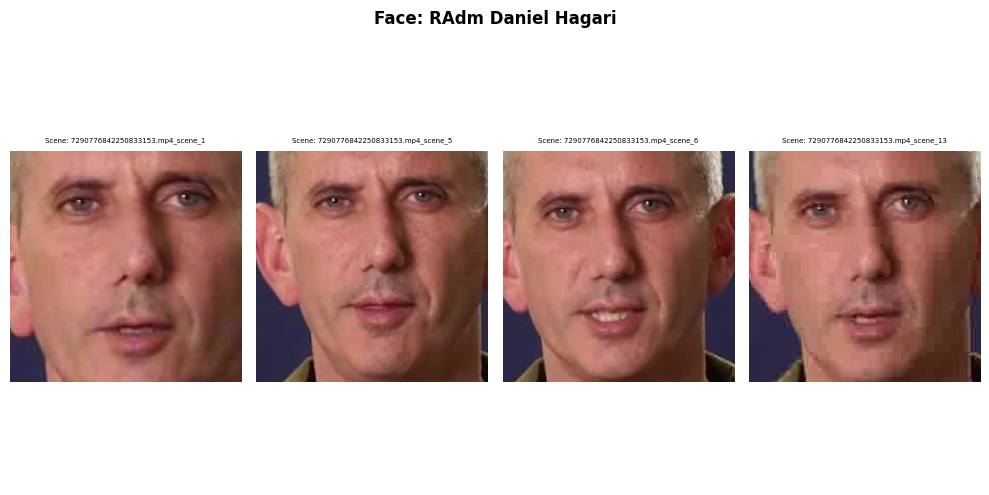

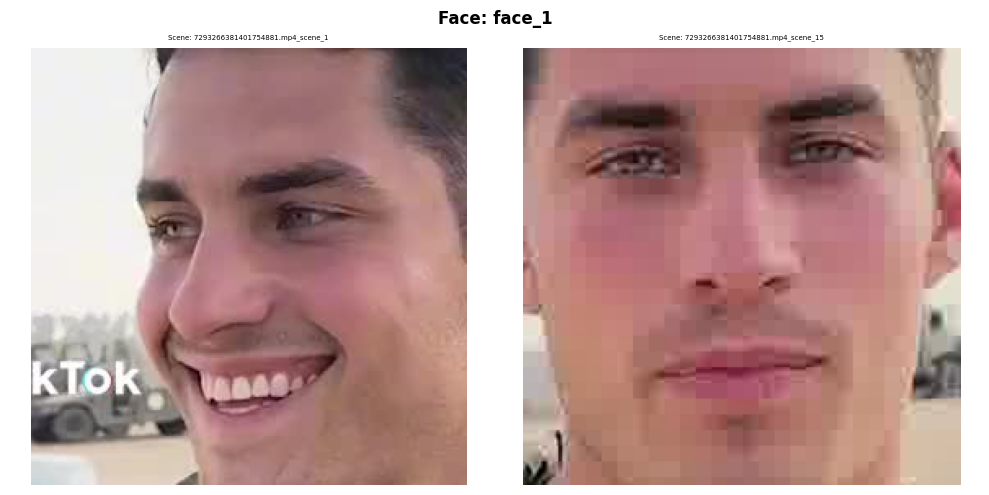

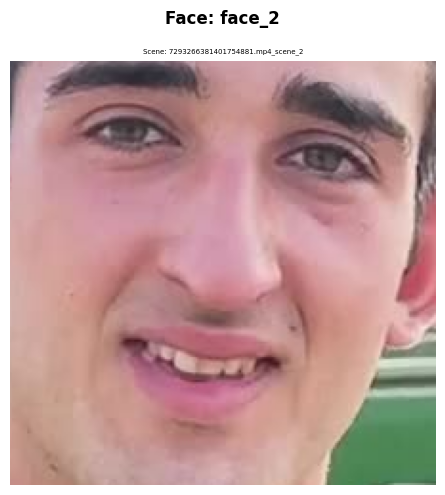

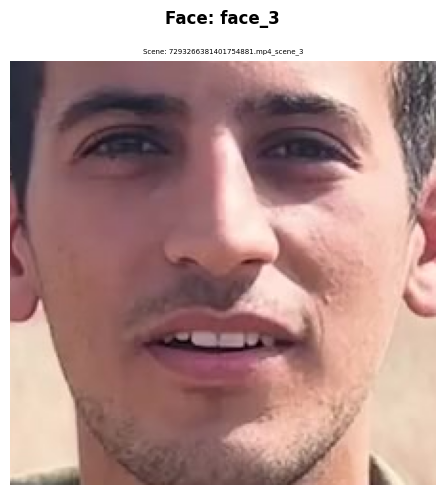

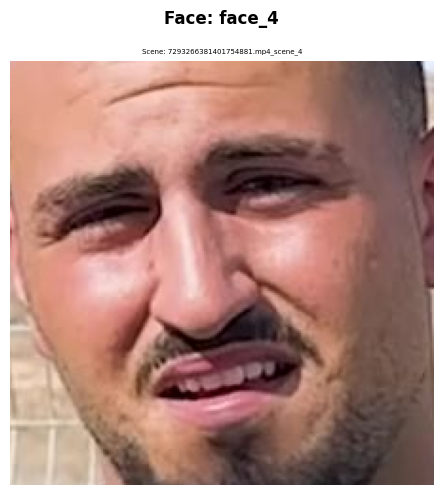

...

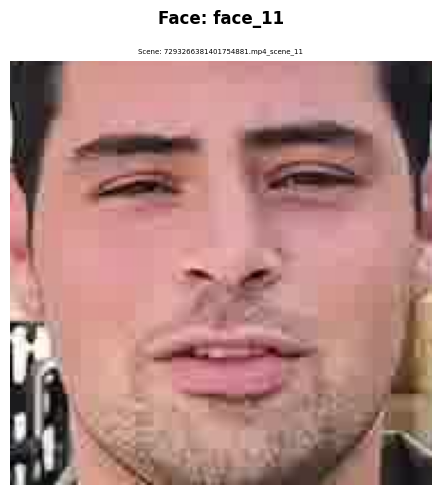

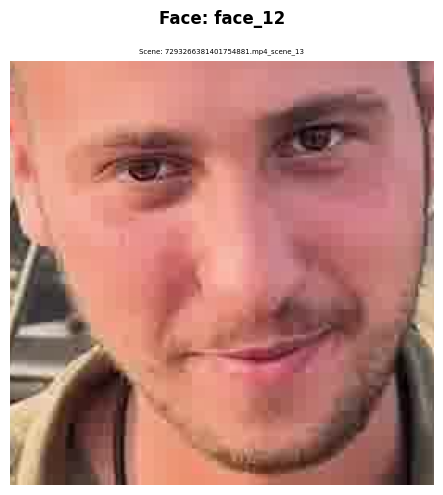

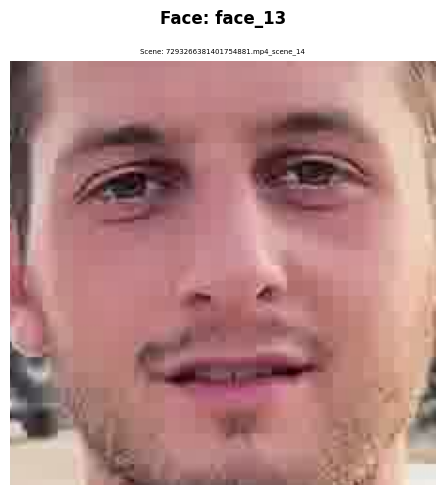

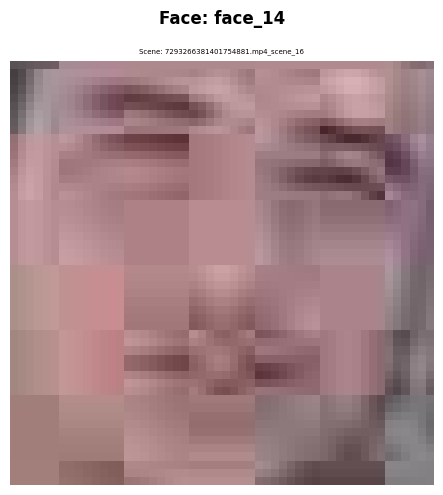

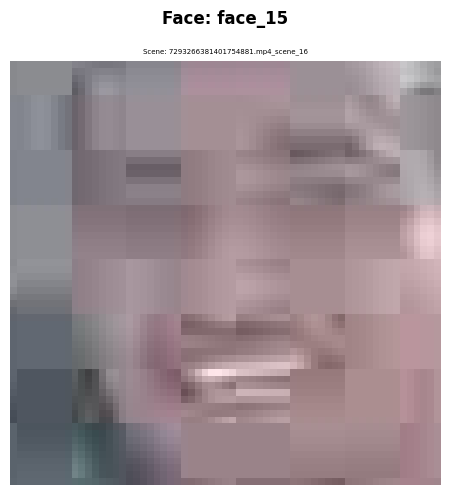

In [ ]:
# Visualise faces found in dataset
def viz_face_match(df_faces=df_faces, df_scene=df_scene, frames_folder=THUMBNAILS_PATH):
    '''
    :param df_face: dataframe containing face information
    :param df_scene: reference df_scene dataframe
    :return:
    '''

    required_columns = ['face_list', 'face_locations_list']
    if not set(required_columns).issubset(set(df_scene.columns)):
            raise ValueError("The current version of the dataframe lacks facial annotations. Have you run the face recognition processor?")

    for i, face in df_faces.iterrows():

        face_label = face['face_label']
        matched_shots = face['matched_shots']

        plt.figure(figsize=(10, 5))
        plt.suptitle(f'Face: {face_label}', fontsize=12, fontweight='bold')
        plt.axis('off')

        counter = 1
        # Total number of matched shots
        num_shots = len(matched_shots)

        if num_shots == 0:
            print("No matches found") # Shouldn't happen but maybe will need it when we ask for
            return

        for i, matched_shot in enumerate(matched_shots):
            # Filter down main dataset to only contain those that there are identified to match
            matched_shot_data = df_scene[df_scene['id'] == matched_shot]
            plt.subplot(1, num_shots, i + 1)

            video_id = matched_shot_data.iloc[0]['url']
            scene_id = matched_shot_data.iloc[0]['id']
            # scene_id example '7295526580741229825.mp4_scene_1'
            cleaned_id = re.sub(r'\.mp4', '', scene_id)
            # cleaned_id example '7295526580741229825_scene_1'
            # create image path based on video_id
            image_path = os.path.join(frames_folder, str(video_id), f'{cleaned_id}.jpeg')

            # Consider that a thumbnail may have multiple faces; Need to match to correct face_label
            # Only matters if we want to crop the faces
            shot_face_list = matched_shot_data.iloc[0]['face_list']
            face_index = shot_face_list.index(face_label)
            # Obtain face_location in shot
            face_locations_list = matched_shot_data.iloc[0]['face_locations_list']
            face_location = face_locations_list[face_index]
            top, right, bottom, left = face_location

            image = face_recognition.load_image_file(image_path)
            face_image = image[top:bottom, left:right]
            plt.imshow(face_image)
            plt.title(f'Scene: {matched_shot}', fontsize=5)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

viz_face_match()

### 2c. Generalized Visual-Language Model (VLM) enabled annotation
Please run the initialisation block, followed by the function ```annotate_vlm(prompt, column_name, model_name', df_scene, frames_folder)``` as suggested below.

#### Initialize functions for VLM Annotation

In [ ]:
!pip install lmstudio
import lmstudio as lms

In [ ]:
def get_qwen_prediction(image_path, prompt, model_name):
    '''
    :param image_path: (str) path to the image file.
    :param prompt: (str) prompt to be used for the model.
    :return: prediction
    '''
    # Check file validity
    # Valid image file extensions
    valid_extensions = ('.jpg', '.jpeg', '.png', '.webp')

    # Valid file extension check
    if not image_path.lower().endswith(valid_extensions):
        raise ValueError(f"Invalid file extension: {image_path}. Supported extensions are {valid_extensions}")

    # File existence check
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"File not found: {image_path}")

    # Check prompt validity
    if not isinstance(prompt, str):
        raise TypeError(f"The prompt must be a string, but got {type(prompt)}")
    if not prompt.strip():  # Empty or whitespace-only prompt
        raise ValueError("The prompt cannot be empty or whitespace. Please provide a valid prompt.")

    image_handle = lms.prepare_image(image_path)  # Convert to image_handle

    model = lms.llm(model_name)
    chat = lms.Chat()
    chat.add_user_message(prompt, images=[image_handle])
    try:
        prediction = model.respond(chat)
    except Exception as e:
        # Handle any exception that might occur during prompting
        raise RuntimeError(f"An error occurred during prompting: {str(e)}")

    # Regex to extract file name
    match = re.search(r'[^/]+$', image_path)
    if match:
        image_name = match.group()
        print(f'Prediction of {image_name}: {prediction.content}')  # Output: 7290776842250833153_scene_1.jpeg
    else:
        print("Error in obtaining file name.")

    return prediction.content

def get_qwen_prediction_batch(df_scene, frames_folder, prompt, column_name, model_name):

    '''
    :param df_scene: dataframe object; Video scene data as generated by 4CAT
    :param frames_folder: file path str; Target folder path where the scene thumbnails are stored
    :param prompt: str; Prompt to be used by the Qwen model
    :param column_name: str;Name of the new column to be added to the dataframe
    :param model_name: str; Name of VLM to be used
    :return: df_scene: dataframe object; Updated dataframe with the Qwen predictions
    '''

    id_list = df_scene['url'].unique().tolist()

    # Loop through list of videos
    for video_id in id_list:
        # video_id example: '7295526580741229825'
        df_scenes = df_scene[df_scene['url'] == video_id]
        scene_list = df_scenes['id'] # Obtain list of scene ids in a video
        # Loop through scenes in specified video
        for scene_id in scene_list:
            # scene_id example '7295526580741229825.mp4_scene_1'
            cleaned_id = re.sub(r'\.mp4', '', scene_id)
            thumbnail_path = os.path.join(frames_folder, str(video_id), f'{cleaned_id}.jpeg')
            print(f'Processing {cleaned_id}.jpeg...')

            prediction = get_qwen_prediction(thumbnail_path, prompt, model_name)

            # Append to new column
            df_scene.loc[df_scene['id'] == scene_id, column_name] = prediction

    return df_scene


In [ ]:
def annotate_vlm(prompt, column_name, model_name='qwen2-vl-7b-instruct', df_scene=df_scene, frames_folder=THUMBNAILS_PATH):
    """
    Takes a specified vision-language model and prompt to analyze video thumbnails and updates the main scene metadata. Requires local developer server of LM Studio to be running with the desired model loaded. See https://lmstudio.ai/docs/app/api for more details.

    :param prompt: A string containing the text instruction for the vision-language model.
    :param column_name: The name of the column in the dataframe where predictions will be
        stored.
    :param model_name: Optional; name of the vision-language model to be used.
        Default is 'qwen2-vl-7b-instruct'.
    :param df_scene: A pandas dataframe containing the input data to be annotated.
    :param frames_folder: Directory path where the input frame files are located.
    :return: None
    """

    if model_name == '':
        model_name = 'qwen2-vl-7b-instruct'

    print(f'Prompting model \'{model_name}\' on LM Studio...')
    df_scene = get_qwen_prediction_batch(df_scene=df_scene,
                                         frames_folder=frames_folder,
                                         prompt=prompt,
                                         column_name=column_name,
                                         model_name=model_name
                                         ) # Reassign as needed; formatted it this way to avoid it being messed up by the order
    print()
    scene_data_path = os.path.join(OUTPUT_DIR, "scene_data.csv")
    df_scene.to_csv(scene_data_path, index=False)
    print("Updated scene data saved to:", scene_data_path)
    print('Done!')
    return df_scene

#### VLM-enabled annotation processor ```annotate_vlm()```
```annotate_vlm()``` is a function that takes a specified vision-language model and prompt to analyze video thumbnails and updates the main scene metadata.

**REQUIREMENTS**
Requires local developer server of LM Studio to be running with the desired model loaded. See https://lmstudio.ai/docs/app/api for more details.




**Optional Parameters**
- ```df_faces``` - Dataframe of faces found in the dataset; Defaults to ```df_faces```
- ```df_scene``` - Main scene dataframe; Defaults to the variable ```df_scene```
- ```frames_folder``` - Folder path of thumbnails; Defaults to the variable ```THUMBNAIL_PATH```


In [ ]:
prompt = "Your job is to recognize the person and gender in the image. If you cannot identify any person, return 'na'. If you can identify people in the image, return their gender in list form (eg '[M, F]'). If you are uncertain of their gender, return 'unknown'. "

column_name = "gender"

df_scene = annotate_vlm(prompt = prompt,
             column_name=column_name,
             model_name='qwen2-vl-7b-instruct',
             df_scene=df_scene,
             frames_folder=THUMBNAILS_PATH
             )
# In test runs, 36 thumbnails took 12 minutes to process on a Macbook Pro (2021) M1 (~20s per thumbnail)

Prompting the model qwen2-vl-7b-instruct on LM Studio...
Processing 7295526580741229825_scene_1.jpeg...
Prediction of 7295526580741229825_scene_1.jpeg: unknown
Processing 7295526580741229825_scene_2.jpeg...
Prediction of 7295526580741229825_scene_2.jpeg: unknown
Processing 7295526580741229825_scene_3.jpeg...
Prediction of 7295526580741229825_scene_3.jpeg: unknown
Processing 7295526580741229825_scene_4.jpeg...
Prediction of 7295526580741229825_scene_4.jpeg: unknown
Processing 7295526580741229825_scene_5.jpeg...
Prediction of 7295526580741229825_scene_5.jpeg: unknown
Processing 7293266381401754881_scene_1.jpeg...
Prediction of 7293266381401754881_scene_1.jpeg: [M]
Processing 7293266381401754881_scene_2.jpeg...
Prediction of 7293266381401754881_scene_2.jpeg: [M]
Processing 7293266381401754881_scene_3.jpeg...
Prediction of 7293266381401754881_scene_3.jpeg: [M]
Processing 7293266381401754881_scene_4.jpeg...
Prediction of 7293266381401754881_scene_4.jpeg: [M]
Processing 7293266381401754881_s

In [ ]:
# Review updated dataframe
df_scene

,id,url,from_dataset,start_frame,start_time,start_fps,end_frame,end_time,end_fps,scene_num,num_scenes_detected,total_video_frames,total_video_duration,post_ids,face_locations_list,face_encodings_list,face_count,face_list,main_face,gender
0,7295526580741229825.mp4_scene_1,7295526580741229825,2765e716c4281cfa216dae395b39560c,0,0 days 00:00:00,25.00,50,0 days 00:00:02,25.00,1,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[],NA,unknown
1,7295526580741229825.mp4_scene_2,7295526580741229825,2765e716c4281cfa216dae395b39560c,50,0 days 00:00:02,25.00,100,0 days 00:00:04,25.00,2,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[],NA,unknown
2,7295526580741229825.mp4_scene_3,7295526580741229825,2765e716c4281cfa216dae395b39560c,100,0 days 00:00:04,25.00,150,0 days 00:00:06,25.00,3,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[],NA,unknown
3,7295526580741229825.mp4_scene_4,7295526580741229825,2765e716c4281cfa216dae395b39560c,150,0 days 00:00:06,25.00,200,0 days 00:00:08,25.00,4,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[],NA,unknown
4,7295526580741229825.mp4_scene_5,7295526580741229825,2765e716c4281cfa216dae395b39560c,200,0 days 00:00:08,25.00,222,0 days 00:00:08.880000,25.00,5,5,222,0 days 00:00:08.880000,"7,2,9,5,5,2,6,5,8,0,7,4,1,2,2,9,8,2,5",[],[],0,[],NA,unknown
5,7293266381401754881.mp4_scene_1,7293266381401754881,2765e716c4281cfa216dae395b39560c,0,0 days 00:00:00,30.00,43,0 days 00:00:01.433000,30.00,1,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(290, 349, 558, 82)]","[[-0.09572270512580872, 0.14782388508319855, 0...",1,[face_1],face_1,[M]
6,7293266381401754881.mp4_scene_2,7293266381401754881,2765e716c4281cfa216dae395b39560c,43,0 days 00:00:01.433000,30.00,74,0 days 00:00:02.467000,30.00,2,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(341, 414, 563, 191)]","[[-0.09561507403850555, 0.06367331743240356, 0...",1,[face_2],face_2,[M]
7,7293266381401754881.mp4_scene_3,7293266381401754881,2765e716c4281cfa216dae395b39560c,74,0 days 00:00:02.467000,30.00,107,0 days 00:00:03.567000,30.00,3,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(341, 414, 563, 191)]","[[-0.13632120192050934, 0.14797300100326538, 0...",1,[face_3],face_3,[M]
8,7293266381401754881.mp4_scene_4,7293266381401754881,2765e716c4281cfa216dae395b39560c,107,0 days 00:00:03.567000,30.00,142,0 days 00:00:04.733000,30.00,4,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(316, 390, 539, 167)]","[[-0.18184730410575867, 0.11430519819259644, 0...",1,[face_4],face_4,[M]
9,7293266381401754881.mp4_scene_5,7293266381401754881,2765e716c4281cfa216dae395b39560c,142,0 days 00:00:04.733000,30.00,176,0 days 00:00:05.867000,30.00,5,18,648,0 days 00:00:21.600000,"7,2,9,3,2,6,6,3,8,1,4,0,1,7,5,4,8,8,1","[(341, 390, 563, 167)]","[[-0.14895114302635193, 0.09422802180051804, 0...",1,[face_5],face_5,[M]


#### Visualise Predictions alongside thumbnails

```viz_vlm_results()``` is a function that visualizes the results of VLM annotation and displays them next to the shot for review

**Parameters**
```target_column``` - Desired column to be reviewed

**Optional Parameters**
- ```df_scene``` - Main scene dataframe; Defaults to the variable ```df_scene```
- ```frames_folder``` - Folder path of thumbnails; Defaults to the variable ```THUMBNAIL_PATH```

In [ ]:
def viz_vlm_results(target_column, df_scene=df_scene, frames_folder=THUMBNAILS_PATH):
    """
    Visualizes Visual Language Model (VLM) prediction results for specific video scenes by
    displaying thumbnails with associated annotations contained in the target column.

    :param target_column: The name of the column in the dataframe 'df_scene'
                          used as the annotation for thumbnails.
    :type target_column: str
    :param df_scene: DataFrame containing the video URLs, scene IDs, and related information.
    :type df_scene: pandas.DataFrame
    :param frames_folder: Folder path where thumbnail image files for each scene are stored.
                          Image files are expected to follow a specific naming convention.
                          Defaults to `THUMBNAILS_PATH`.
    :type frames_folder: str
    :return: None. The function creates and shows visualizations for the given video(s)
             and their corresponding scenes.
    :rtype: None
    """

    # Check for the correct dataframe
    if not target_column in df_scene.columns:
            raise ValueError("The dataframe lacks the desired target column. Please check again.")

    # Visualize by video
    video_list = df_scene['url'].unique()
    # Set maximum thumbnails per row to prevent overcrowding
    max_row_len = 10

    for video in video_list:
        df_scene_for_vid = df_scene[df_scene['url'] == video].reset_index(drop=True)
        num_scenes = len(df_scene_for_vid)
        video_id = df_scene_for_vid.iloc[0]['url']

        num_rows = num_scenes // max_row_len + 1 # Ceiling division to calculate number of rows
        plt.figure(figsize=(10, 5))
        plt.suptitle(f"VLM Predictions for shot thumbnails in {video_id} for column \'{target_column}\'", fontsize=12)

        plt.axis('off')


        # Loop through scenes in video
        for i, scene in df_scene_for_vid.iterrows():
            scene_id = scene['id']
            # scene_id example '7295526580741229825.mp4_scene_1'
            cleaned_id = re.sub(r'\.mp4', '', scene_id)
            # cleaned_id example '7295526580741229825_scene_1'
            # create image path based on video_id
            image_path = os.path.join(frames_folder, str(video_id), f'{cleaned_id}.jpeg')

            image = face_recognition.load_image_file(image_path)

            # Display image
            if num_scenes > max_row_len:
                plt.subplot(num_rows, max_row_len, i+1)
            else:
                plt.subplot(1, num_scenes, i+1)

            plt.title(f"Annotation for scene {scene['scene_num']}: \n{scene[target_column]}", fontsize=5)
            plt.imshow(image)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

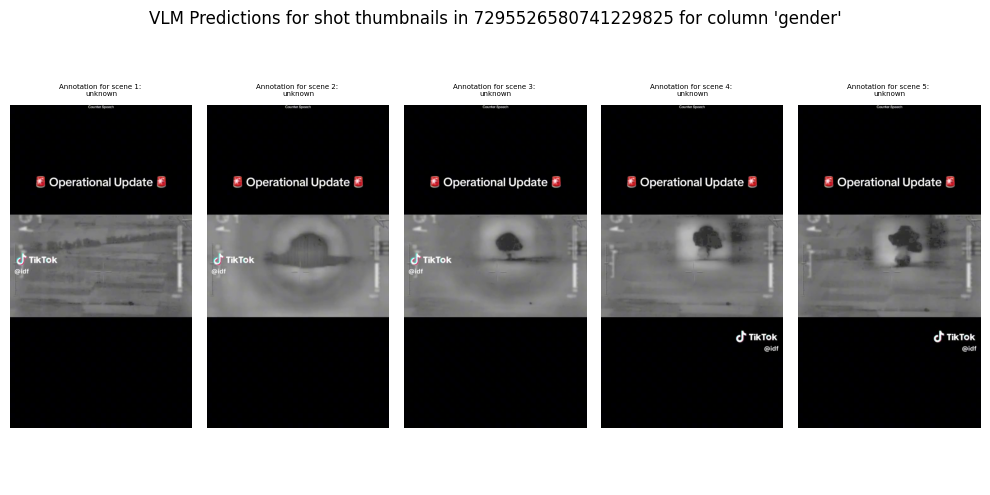

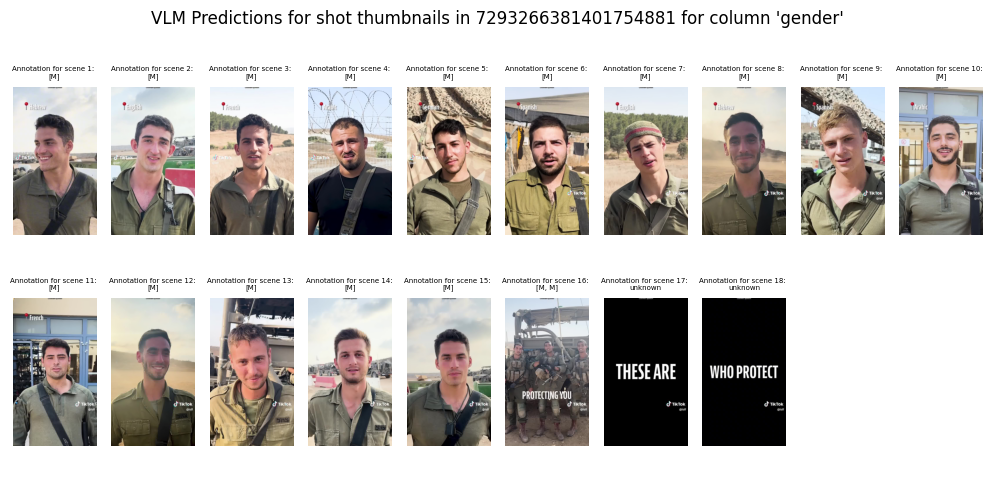

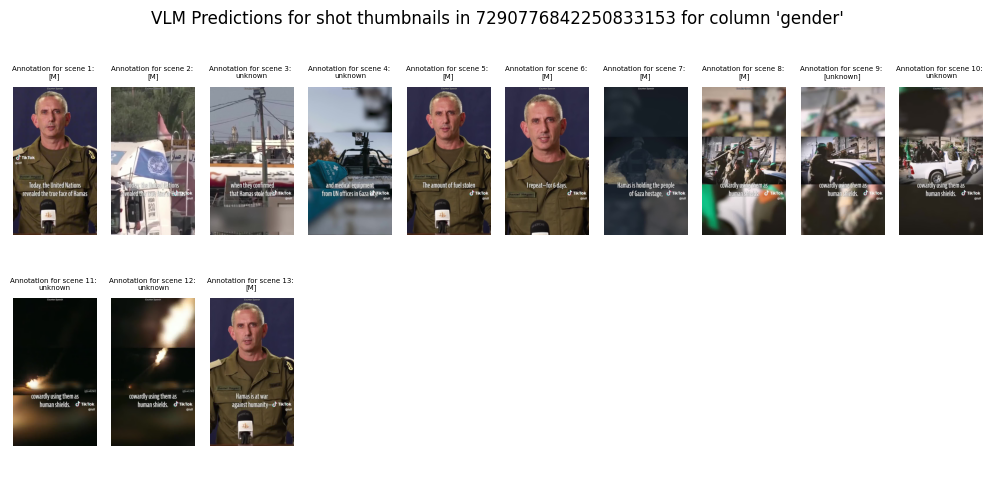

In [ ]:
viz_vlm_results('gender')

# 3. Visualisation and Gathering Insights

### General Timeline Visualisation

In [ ]:
def viz_timeline_stripe(df_scene=df_scene, stripe_height=0.02, dpi=300):
    df_scene = pd.read_csv(SCENE_CSV_PATH)
    shot_csv_files = [f for f in os.listdir(OUTPUT_DIR) if f.endswith("_shotscale.csv")]



    for shot_csv in shot_csv_files:
        video_id = shot_csv.replace("_shotscale.csv", "")
        df_shot = pd.read_csv(os.path.join(OUTPUT_DIR, shot_csv))
        if "Image" not in df_shot.columns:
           print(f"⚠️ 文件 {shot_csv} 缺少 Image 列，跳过")
           continue
        df_shot["scene_num"] = df_shot["Image"].apply(extract_scene_num)

        df_scene_video = df_scene[df_scene["url"].astype(str).str.strip() == video_id].copy()
        if df_scene_video.empty:
            continue

        df_scene_video["start_seconds"] = df_scene_video["start_time"].apply(time_str_to_seconds)
        df_scene_video["end_seconds"] = df_scene_video["end_time"].apply(time_str_to_seconds)
        max_time = df_scene_video["end_seconds"].max()
        if pd.isna(max_time) or max_time == 0:
            continue

        for _, scene_row in df_scene_video.iterrows():
            scene_num = scene_row["scene_num"]
            start = scene_row["start_seconds"] / max_time
            end = scene_row["end_seconds"] / max_time
            shots_in_scene = df_shot[df_shot["scene_num"] == scene_num]
            if shots_in_scene.empty:
                continue
            duration = end - start
            step = duration / len(shots_in_scene)
            for i, (_, shot_row) in enumerate(shots_in_scene.iterrows()):
                shot_scale = shot_row["Shot Scale"]
                shot_start = start + i * step
                shot_end = shot_start + step
                all_shots.append((video_id, shot_scale, shot_start, shot_end))

    if not all_shots:
        print("⚠️ 无数据")
        return

    video_ids = sorted(set([x[0] for x in all_shots]))
    video_to_y = {vid: idx for idx, vid in enumerate(video_ids)}

    fig_height = len(video_ids) * stripe_height
    fig, ax = plt.subplots(figsize=(12, fig_height))
    for vid, scale, start, end in all_shots:
        y = video_to_y[vid] * stripe_height
        color = SHOT_SCALE_COLORS.get(scale, "#999999")
        rect = patches.Rectangle((start, y), end - start, stripe_height, linewidth=0, facecolor=color)
        ax.add_patch(rect)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, len(video_ids) * stripe_height)
    ax.axis("off")
    plt.tight_layout()
    output_path = os.path.join(OUTPUT_DIR, "all_videos_stripe_timeline.png")
    plt.savefig(output_path, dpi=dpi)
    plt.close()
    print(f"✅ 条纹图已保存：{output_path}")

# get result
if __name__ == "__main__":
    generate_stripe_style_timeline()

### Timeline Visualisations based on identified faces
This section contains the functions that can be used to visualise face recognition annotations as a timeline. This will also add annotations to the chart containing data on the total number of faces found in the video.

**Visualisation Functions**
- ```viz_face_timeline_abs()``` - Visualizes videos in absolute timeline form with shots color coded by faces
- ```viz_face_timeline_norm()``` - Visualizes videos in a normalized timeline form with shots color coded by faces


**Parameters (Common to both):**

```df_scene``` - Dataframe containing scene metadata; Defaults to ```df_scene```

```match_threshold``` - A threshold to filter the count face matches (default is 0) to avoid generating undesired color noise. If a face is found in the dataset less times than the match_threshold, it will be grouped as 'Others'

#### ```viz_face_timeline_abs()```
Visualizes videos in absolute timeline form with shots color coded by faces


In [ ]:
def set_main_face(face_list): # Handle situations with multiple faces
    if len(face_list) == 0:
        return 'NA'
    elif len(face_list) > 1:
        print("Warning: Multiple faces found in the image. Will be uniquely marked as pink.")
        return 'Multiple faces'
    elif len(face_list) == 1:
        return face_list[0] # where it is a string for face_label

def viz_face_timeline_abs(df_scene=df_scene, match_threshold=0):
    """
    Visualizes the face timeline across videos by plotting the presence of faces
    in different video scenes along a timeline. Each face is assigned a color for
    visual differentiation, and multiple faces or scenes with no faces have unique
    color codes. The visualization includes a legend for reference and provides an
    overview of unique faces and shots with multiple faces.

    :param df_scene: A DataFrame containing scene data including `url`, `start_time`,
        `end_time`, `face_list`, and `total_video_duration`. The `face_list` column
        should contain lists of faces present in each scene.
    :type df_scene: pandas.DataFrame
    :param match_threshold: A threshold to filter the count face matches
        (default is 0) to avoid generating undesired color noise. If a face is found in the dataset less times than the match_threshold, it will be grouped as 'Others'
    :type match_threshold: int
    """
    required_columns = ['face_list']
    if not set(required_columns).issubset(set(df_scene.columns)):
            raise ValueError("The current version of the dataframe lacks facial annotations. Have you run the face recognition processor?")

    # Extract unique video IDs from scene_data
    unique_ids = df_scene['url'].unique()

    fig, ax = plt.subplots(figsize=(10, 3 * len(unique_ids)))

    y_offset = 0
    df_scene['main_face'] = df_scene['face_list'].apply(set_main_face)
    counts = df_scene['main_face'].value_counts()
    below_threshold = counts[counts < match_threshold] # Faces that don't clear the cut-off
    df_scene['main_face'] = df_scene['main_face'].where(
    ~df_scene['main_face'].isin(below_threshold.index), 'Others')

    unique_faces = df_scene['main_face'].unique()

    # Assign colour based on face
    # Initialize color mapping
    label_to_color = {}

    for i, label in enumerate(unique_faces):
        if label == 'NA':
            label_to_color[label] = 'grey'  # Grey for 'NA'
        elif label == 'Multiple faces':
            label_to_color[label] = 'magenta'  # Magenta for 'Multiple faces'
        elif label == 'Others':
            label_to_color[label] = 'blueviolet'
        else:
            # Assign a random color from the rainbow colormap for other unique faces
            label_to_color[label] = plt.cm.rainbow(i / len(unique_faces))

    for video_id in unique_ids:
        # Filter scenes for the current video ID
        df_sub_scenes = df_scene[df_scene['url'] == video_id]
        total_duration = df_sub_scenes.iloc[0]['total_video_duration']
        unique_face_list = set()
        for i, scene in df_sub_scenes.iterrows():
            face_list = scene['face_list']
            unique_face_list.update(face_list)
        unique_face_count = len(unique_face_list)
        multiple_face_count = 0

        # Loop over all scenes for the current video ID
        for i, scene in df_sub_scenes.iterrows():
            start_time = scene['start_time'].total_seconds() # Timedelta object to seconds
            end_time = scene['end_time'].total_seconds()
            duration = end_time - start_time
            faces = scene['face_list']

            # Assign colors for faces (if any) and draw rect
            if faces:
                main_face = scene['main_face']
                if main_face == 'Multiple faces':
                    multiple_face_count += 1
                color = label_to_color.get(main_face, 'black')  # Default to black if no label match
                rect = plt.Rectangle((start_time, y_offset), duration, 1, edgecolor='black', facecolor=color, lw=1)
                ax.add_patch(rect)
            else:
                # If no faces found, use a default color (e.g., light gray)
                rect = plt.Rectangle((start_time, y_offset), duration, 1, edgecolor='black', facecolor='lightgray', lw=1)
                ax.add_patch(rect)

        # Annotate with number of faces
        ax.text(
            df_scene['total_video_duration'].dt.total_seconds().max() + 2,
            y_offset + 0.5,
            f"Number of unique faces: {unique_face_count}\nShots with multiple faces: {multiple_face_count}",
            ha='left', va='center'
        )

        print(f'Processed video {video_id}, total duration: {total_duration.total_seconds()}s')

        y_offset += 1.5  # Increment for next video

    # Set axis details
    ax.set_xlim(0,max(df_scene['total_video_duration'].dt.total_seconds()))
    ax.set_ylim(0, y_offset)
    ax.set_xlabel('Time (in seconds)')
    ax.set_yticks(np.arange(0.75, y_offset, 1.5))
    ax.set_yticklabels(unique_ids)
    ax.set_title('Shot Timeline in Videos')

    # Add legend for the colors
    legend_handles = [
        plt.Line2D([0], [0], color=color, lw=4, label=label)
        for label, color in label_to_color.items()
    ]

    # Place the legend below the graph, centered
    ax.legend(
        handles=legend_handles,
        title='Legend for faces',
        loc='lower center',
        bbox_to_anchor=(0.5, -0.3),  # Center the legend below the graph
        ncol=4,  # Adjust columns based on labels for better spacing
        frameon=False
    )

    plt.show()

Processed video 7295526580741229825, total duration: 8.88s
Processed video 7293266381401754881, total duration: 21.6s
Processed video 7290776842250833153, total duration: 48.715s


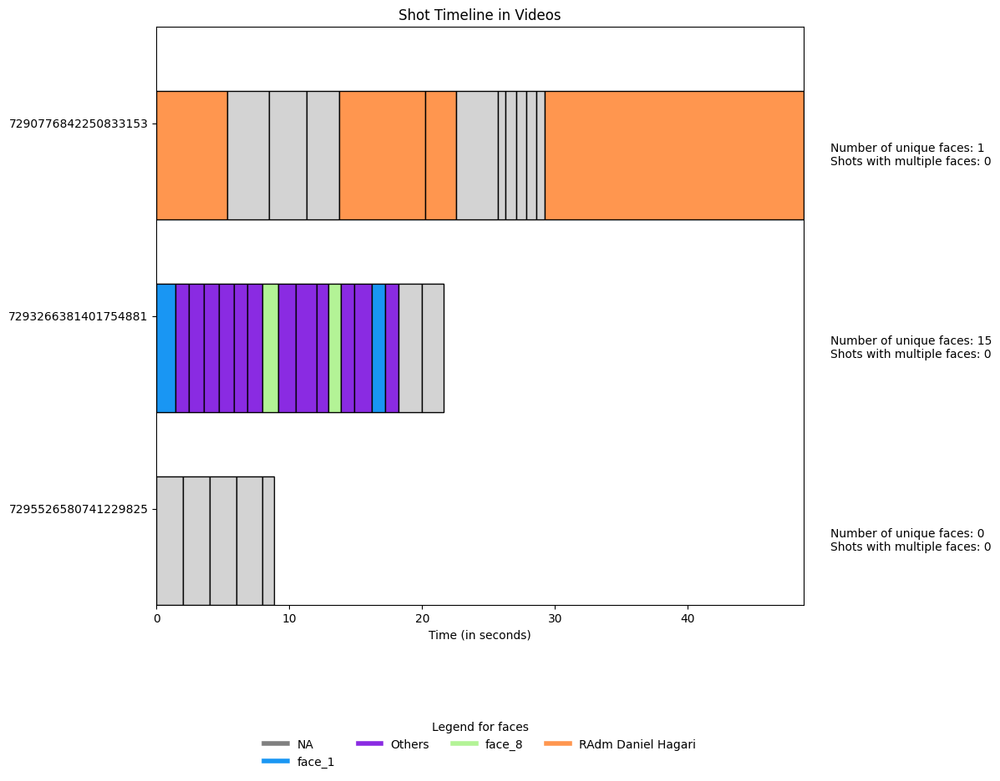

In [ ]:
viz_face_timeline_abs(df_scene, match_threshold=2)

#### ```viz_face_timeline_norm()```
Visualizes videos in a normalized timeline form with shots color coded by faces

In [ ]:
def viz_face_timeline_norm(df_scene=df_scene, match_threshold=0):
    """
    Generate a timeline visualization with shot durations normalized
    as a percentage of the full video duration.

    :param df_scene: Dataframe containing scene metadata
    :param match_threshold: Minimum number of face matches to include as a colour
    """
    required_columns = ['face_list']
    if not set(required_columns).issubset(set(df_scene.columns)):
            raise ValueError("The current version of the dataframe lacks facial annotations. Have you run the face recognition processor?")

    # Extract unique video IDs from scene_data
    unique_ids = df_scene['url'].unique()

    fig, ax = plt.subplots(figsize=(10, 3 * len(unique_ids)))

    y_offset = 0
    df_scene['main_face'] = df_scene['face_list'].apply(set_main_face)
    counts = df_scene['main_face'].value_counts()
    below_threshold = counts[counts <= match_threshold] # Faces that don't clear the cut-off
    df_scene['main_face'] = df_scene['main_face'].where(
    ~df_scene['main_face'].isin(below_threshold.index), 'Others')


    unique_faces = list(set(df_scene['main_face']))


    # Assign colour based on face
    # Initialize color mapping
    label_to_color = {}

    for i, label in enumerate(unique_faces):
        if label == 'NA':
            label_to_color[label] = 'grey'  # Grey for 'NA'
        elif label == 'Multiple faces':
            label_to_color[label] = 'magenta'  # Magenta for 'Multiple faces'
        elif label == 'Others': # Falls below match threshold
            label_to_color[label] = 'blueviolet'
        else:
            # Assign a random color from the hsv colormap for other unique faces
            label_to_color[label] = plt.cm.rainbow(i / len(unique_faces))

    for video_id in unique_ids:
        # Filter scenes for the current video ID
        # Filter scenes for the current video ID
        df_sub_scenes = df_scene[df_scene['url'] == video_id]
        total_duration = df_sub_scenes.iloc[0]['total_video_duration']
        unique_face_list = set()
        for i, scene in df_sub_scenes.iterrows():
            face_list = scene['face_list']
            unique_face_list.update(face_list)
        unique_face_count = len(unique_face_list)
        multiple_face_count = 0

        # Loop over all scenes for the current video ID
        for i, scene in df_sub_scenes.iterrows():
            start_time = scene['start_time'].total_seconds()
            start_time_norm = start_time / total_duration.total_seconds() * 100
            end_time = scene['end_time'].total_seconds()
            duration = end_time - start_time
            normalized_duration = duration / total_duration.total_seconds() * 100
            faces = scene['face_list']

            # Assign colors for faces (if any) and draw rect
            if faces:
                main_face = scene['main_face']
                if main_face == 'Multiple faces':
                    multiple_face_count += 1
                color = label_to_color.get(main_face, 'black')  # Default to black if no label match
                rect = plt.Rectangle((start_time_norm, y_offset), normalized_duration, 1, edgecolor='black', facecolor=color, lw=1)
                ax.add_patch(rect)
            else:
                # If no faces found, use a default color (e.g., light gray)
                rect = plt.Rectangle((start_time_norm, y_offset), normalized_duration, 1, edgecolor='black', facecolor='lightgray', lw=1)
                ax.add_patch(rect)

        # Annotate with number of faces
        ax.text(
            100 + 2,
            y_offset + 0.5,
            f"Number of unique faces: {unique_face_count}\nShots with multiple faces: {multiple_face_count}\nDuration of video: {total_duration}s",
            ha='left', va='center'
        )

        print(f'Processed video {video_id}, total duration: {total_duration.total_seconds()}s')

        y_offset += 1.5  # Increment for next video

    # Set axis details
    ax.set_xlim(0, 100)
    ax.set_ylim(0, y_offset)
    ax.set_xlabel("Video Duration (%)")
    ax.set_yticks(np.arange(0.75, y_offset, 1.5))
    ax.set_yticklabels(unique_ids)
    ax.set_ylabel("Videos")
    ax.set_title("Normalized Video Timeline by Shots")
    plt.tight_layout()

    # Add legend for the colors
    legend_handles = [
        plt.Line2D([0], [0], color=color, lw=4, label=label)
        for label, color in label_to_color.items()
    ]

    # Place the legend below the graph, centered
    ax.legend(
        handles=legend_handles,
        title='Legend for faces',
        loc='lower center',
        bbox_to_anchor=(0.5, -0.3),  # Center the legend below the graph
        ncol=4,  # Adjust columns based on labels for better spacing
        frameon=False
    )

    plt.show()

Processed video 7295526580741229825, total duration: 8.88s
Processed video 7293266381401754881, total duration: 21.6s
Processed video 7290776842250833153, total duration: 48.715s


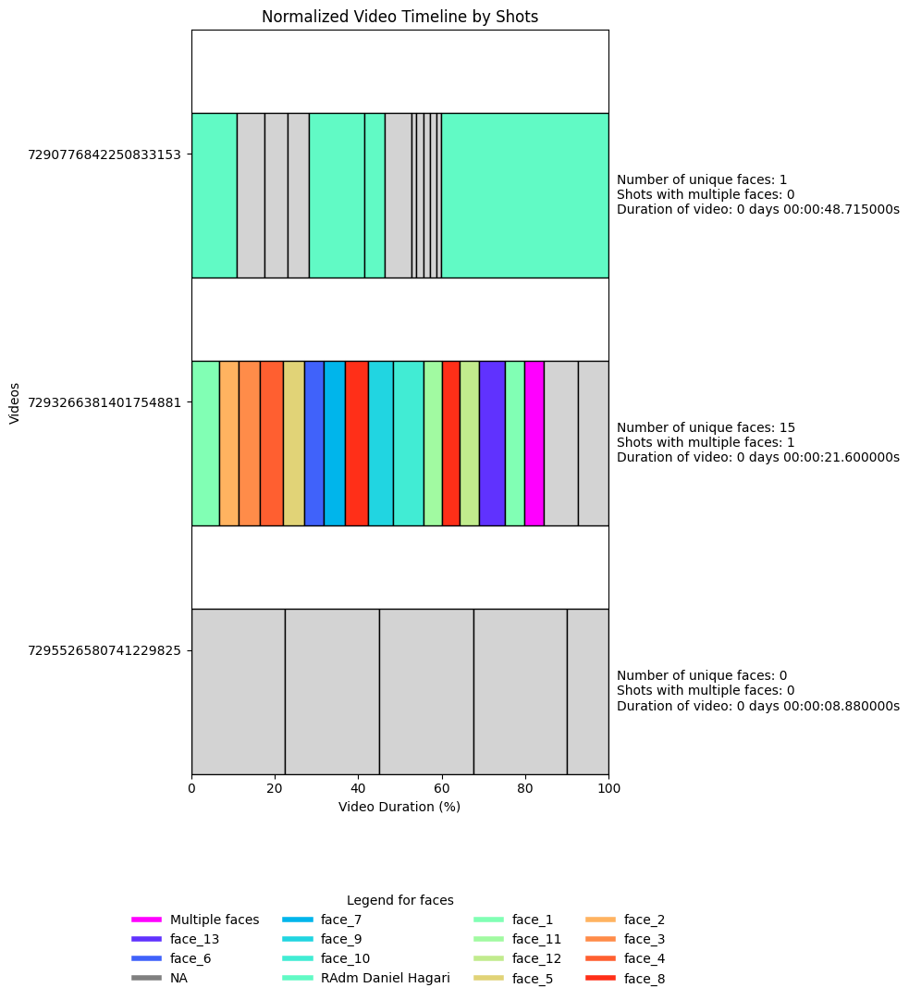

In [ ]:
viz_face_timeline_norm()